In [ ]:
import numpy as np
import pandas as pd
import tqdm
import matplotlib.pyplot as plt
import re
import math

In [ ]:
from io import BytesIO
from PIL import Image
import requests
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
import gensim
from scipy.sparse import coo_matrix, csr_matrix
from scipy.sparse.linalg import svds

In [ ]:
pd.options.mode.chained_assignment = None

In [ ]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

def rec_imaging(product_ids, content_dict, measure=None, top_n=5):
    picture_urls = [content_dict[i] for i in product_ids]
    cnt = 0
    for idx, chunk in enumerate(chunks(picture_urls, top_n)):
        fig = plt.figure(figsize=(20, 4))
        for n, i in enumerate(chunk):
            try:
                r = requests.get(i)
                im = Image.open(BytesIO(r.content))

            except:
                print('Something went wrong with {url}'.format(url=i))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.title.set_text("measure = {}".format(np.round(measure[cnt], 4)))
                cnt += 1
            plt.imshow(im)
            plt.axis('off')
        plt.show()

In [ ]:
books = pd.read_csv("BX-Books.csv", encoding='utf8')
interactions = pd.read_csv("BX-Book-Ratings.csv", sep=";", encoding = "ISO-8859-1")

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
index = []
for i in range(books['Year-Of-Publication'].shape[0]):
    try:
        int(books['Year-Of-Publication'][i])
    except:
        index.append(i)

In [ ]:
index

[209538, 220731, 221678]

In [ ]:
books = books.drop([209538, 220731, 221678])

In [ ]:
books['Year-Of-Publication'] = books['Year-Of-Publication'].apply(lambda x: int(x))

In [ ]:
books['Year-Of-Publication'].unique()

array([2002, 2001, 1991, 1999, 2000, 1993, 1996, 1988, 2004, 1998, 1994,
       2003, 1997, 1983, 1979, 1995, 1982, 1985, 1992, 1986, 1978, 1980,
       1952, 1987, 1990, 1981, 1989, 1984,    0, 1968, 1961, 1958, 1974,
       1976, 1971, 1977, 1975, 1965, 1941, 1970, 1962, 1973, 1972, 1960,
       1966, 1920, 1956, 1959, 1953, 1951, 1942, 1963, 1964, 1969, 1954,
       1950, 1967, 2005, 1957, 1940, 1937, 1955, 1946, 1936, 1930, 2011,
       1925, 1948, 1943, 1947, 1945, 1923, 2020, 1939, 1926, 1938, 2030,
       1911, 1904, 1949, 1932, 1928, 1929, 1927, 1931, 1914, 2050, 1934,
       1910, 1933, 1902, 1924, 1921, 1900, 2038, 2026, 1944, 1917, 1901,
       2010, 1908, 1906, 1935, 1806, 2021, 2012, 2006, 1909, 2008, 1378,
       1919, 1922, 1897, 2024, 1376, 2037])

In [ ]:
books['Year-Of-Publication'].value_counts().values

array([17627, 17431, 17359, 17232, 15766, 14890, 14358, 14030, 13546,
       11796, 10602,  9906,  9389,  8660,  7936,  7492,  6529,  5841,
        5839,  5343,  4986,  4618,  4499,  4197,  3279,  2676,  2208,
        2131,  1897,  1597,  1219,  1023,   923,   772,   540,   459,
         339,   233,   183,   176,   173,   149,   133,   132,   132,
         123,   103,    77,    76,    74,    70,    63,    54,    46,
          40,    36,    34,    33,    32,    19,    14,    14,    13,
          13,    11,    11,    10,     9,     9,     8,     8,     7,
           7,     7,     7,     7,     5,     5,     4,     4,     3,
           3,     3,     3,     3,     2,     2,     2,     2,     2,
           2,     2,     2,     2,     2,     2,     2,     1,     1,
           1,     1,     1,     1,     1,     1,     1,     1,     1,
           1,     1,     1,     1,     1,     1,     1,     1])

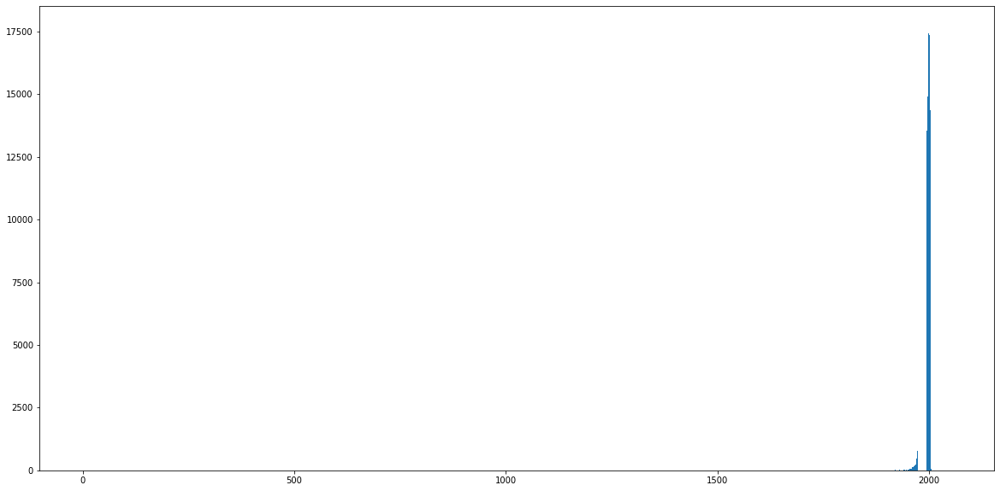

In [ ]:
plt.figure(figsize=(20, 10))
plt.bar(books['Year-Of-Publication'].value_counts().index, books['Year-Of-Publication'].value_counts().values)
plt.show()

#### Удалим книги с датой публикации раньше 1900 года и позже 2020

In [ ]:
books = books.loc[books['Year-Of-Publication'] < 2020]
books = books.loc[books['Year-Of-Publication'] > 1900]

In [ ]:
books['Year-Of-Publication']

0         2002
1         2001
2         1991
3         1999
4         1999
          ... 
271355    1988
271356    1991
271357    2004
271358    1996
271359    2000
Name: Year-Of-Publication, Length: 266715, dtype: int64

In [ ]:
books['Year-Of-Publication'].unique()

array([2002, 2001, 1991, 1999, 2000, 1993, 1996, 1988, 2004, 1998, 1994,
       2003, 1997, 1983, 1979, 1995, 1982, 1985, 1992, 1986, 1978, 1980,
       1952, 1987, 1990, 1981, 1989, 1984, 1968, 1961, 1958, 1974, 1976,
       1971, 1977, 1975, 1965, 1941, 1970, 1962, 1973, 1972, 1960, 1966,
       1920, 1956, 1959, 1953, 1951, 1942, 1963, 1964, 1969, 1954, 1950,
       1967, 2005, 1957, 1940, 1937, 1955, 1946, 1936, 1930, 2011, 1925,
       1948, 1943, 1947, 1945, 1923, 1939, 1926, 1938, 1911, 1904, 1949,
       1932, 1928, 1929, 1927, 1931, 1914, 1934, 1910, 1933, 1902, 1924,
       1921, 1944, 1917, 1901, 2010, 1908, 1906, 1935, 2012, 2006, 1909,
       2008, 1919, 1922])

In [ ]:
books

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...
...,...,...,...,...,...,...,...,...
271355,0440400988,There's a Bat in Bunk Five,Paula Danziger,1988,Random House Childrens Pub (Mm),http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...
271356,0525447644,From One to One Hundred,Teri Sloat,1991,Dutton Books,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...
271357,006008667X,Lily Dale : The True Story of the Town that Ta...,Christine Wicker,2004,HarperSanFrancisco,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...
271358,0192126040,Republic (World's Classics),Plato,1996,Oxford University Press,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...


In [ ]:
interactions = interactions[interactions["Book-Rating"] != 0]

In [ ]:
books_meets = interactions.groupby("ISBN")["User-ID"].count().reset_index().rename(columns={"User-ID": "user_num"})

In [ ]:
user_meets = interactions.groupby("User-ID")["ISBN"].count().reset_index().rename(columns={"ISBN": "books_num"})

In [ ]:
interactions = interactions.merge(books_meets, on=["ISBN"]).merge(user_meets, on=["User-ID"])

In [ ]:
interactions = interactions[(interactions["user_num"] > 5) & 
                            (interactions["books_num"] > 5) &
                            (interactions["books_num"] < 200)]

In [ ]:
users = pd.read_csv('BX-Users.csv', delimiter=';', encoding = 'ISO-8859-1')

In [ ]:
interactions = interactions.merge(books[["ISBN", "Image-URL-M", "Book-Title"]].rename(
    columns={"Image-URL-M": "picture_url"}), on=["ISBN"])

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

In [ ]:
interactions["product_id"] = le.fit_transform(interactions["ISBN"])
interactions["vid"] = le.fit_transform(interactions["User-ID"])

In [ ]:
interactions.head()

,User-ID,ISBN,Book-Rating,user_num,books_num,picture_url,Book-Title,product_id,vid
0,86583,3404139178,9,8,18,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10268,3426
1,132500,3404139178,10,8,43,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10268,5220
2,66483,3404139178,10,8,83,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10268,2608
3,276866,3404139178,9,8,11,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10268,10830
4,106534,3404139178,6,8,6,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10268,4205


In [ ]:
interactions

,User-ID,ISBN,Book-Rating,user_num,books_num,picture_url,Book-Title,product_id,vid
0,86583,3404139178,9,8,18,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10268,3426
1,132500,3404139178,10,8,43,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10268,5220
2,66483,3404139178,10,8,83,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10268,2608
3,276866,3404139178,9,8,11,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10268,10830
4,106534,3404139178,6,8,6,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10268,4205
...,...,...,...,...,...,...,...,...,...
109537,27551,0849912970,10,6,6,http://images.amazon.com/images/P/0849912970.0...,Traveling Light: Releasing the Burdens You Wer...,9377,1030
109538,206652,1860465811,9,8,10,http://images.amazon.com/images/P/1860465811.0...,Wind-Up Bird Chronicle,10098,8072
109539,223525,1588720284,8,6,13,http://images.amazon.com/images/P/1588720284.0...,Why Your Life Sucks: And What You Can Do Abou...,10031,8711
109540,94153,0060652926,9,7,14,http://images.amazon.com/images/P/0060652926.0...,Mere Christianity,268,3720


In [ ]:
csr_rates = coo_matrix((interactions["Book-Rating"], (interactions["vid"], interactions["product_id"])), 
                            shape=(len(set(interactions["vid"])), len(set(interactions["product_id"]))))

In [ ]:
users["Age"].unique()

array([ nan,  18.,  17.,  61.,  26.,  14.,  25.,  19.,  46.,  55.,  32.,
        24.,  20.,  34.,  23.,  51.,  31.,  21.,  44.,  30.,  57.,  43.,
        37.,  41.,  54.,  42.,  50.,  39.,  53.,  47.,  36.,  28.,  35.,
        13.,  58.,  49.,  38.,  45.,  62.,  63.,  27.,  33.,  29.,  66.,
        40.,  15.,  60.,   0.,  79.,  22.,  16.,  65.,  59.,  48.,  72.,
        56.,  67.,   1.,  80.,  52.,  69.,  71.,  73.,  78.,   9.,  64.,
       103., 104.,  12.,  74.,  75., 231.,   3.,  76.,  83.,  68., 119.,
        11.,  77.,   2.,  70.,  93.,   8.,   7.,   4.,  81., 114., 230.,
       239.,  10.,   5., 148., 151.,   6., 101., 201.,  96.,  84.,  82.,
        90., 123., 244., 133.,  91., 128.,  94.,  85., 141., 110.,  97.,
       219.,  86., 124.,  92., 175., 172., 209., 212., 237.,  87., 162.,
       100., 156., 136.,  95.,  89., 106.,  99., 108., 210.,  88., 199.,
       147., 168., 132., 159., 186., 152., 102., 116., 200., 115., 226.,
       137., 207., 229., 138., 109., 105., 228., 18

In [ ]:
users = users.dropna()

In [ ]:
users["Age"].value_counts()

24.0     5687
25.0     5618
26.0     5547
23.0     5456
27.0     5383
         ... 
162.0       1
189.0       1
207.0       1
140.0       1
159.0       1
Name: Age, Length: 165, dtype: int64

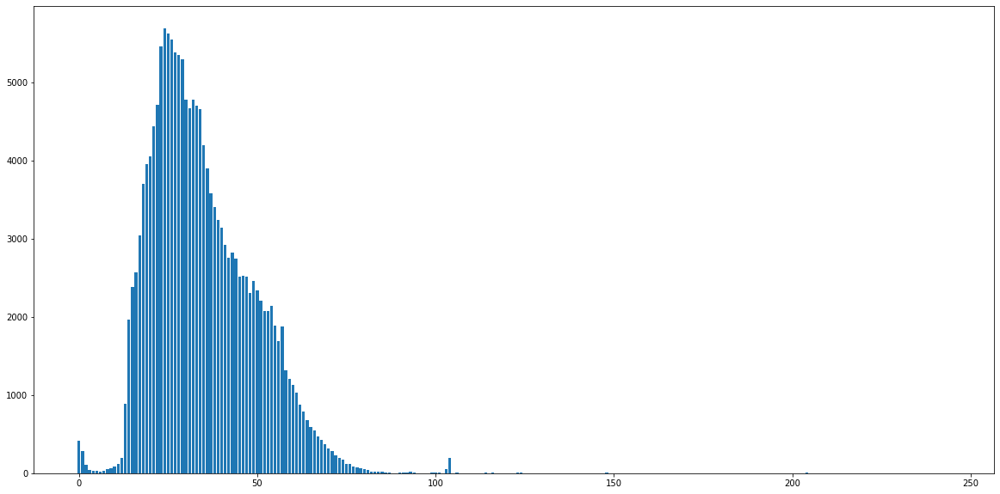

In [ ]:
plt.figure(figsize=(20, 10))
plt.bar(users["Age"].value_counts().index, users["Age"].value_counts().values)
plt.show()

#### Удалим пользователей старше 90 лет и младше 10

In [ ]:
users = users[(users["Age"] > 10) & 
              (users["Age"] < 90)]

In [ ]:
users

,User-ID,Location,Age
1,2,"stockton, california, usa",18.0
3,4,"porto, v.n.gaia, portugal",17.0
5,6,"santa monica, california, usa",61.0
9,10,"albacete, wisconsin, spain",26.0
10,11,"melbourne, victoria, australia",14.0
...,...,...,...
278848,278849,"georgetown, ontario, canada",23.0
278850,278851,"dallas, texas, usa",33.0
278851,278852,"brisbane, queensland, australia",32.0
278852,278853,"stranraer, n/a, united kingdom",17.0


In [ ]:
users["Location"] = users["Location"].apply(lambda x: re.split(r', ', x).pop())

In [ ]:
#users["Location"] = le.fit_transform(users["Location"])

In [ ]:
interactions = interactions.merge(users, on=["User-ID"])

### Персональный топ

In [ ]:
interactions

,User-ID,ISBN,Book-Rating,user_num,books_num,picture_url,Book-Title,product_id,vid,Location,Age
0,86583,3404139178,9,8,18,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10268,3426,germany,31.0
1,86583,3453061187,8,13,18,http://images.amazon.com/images/P/3453061187.0...,Die Jury. Roman.,10360,3426,germany,31.0
2,86583,3426609061,7,8,18,http://images.amazon.com/images/P/3426609061.0...,House Of God.,10296,3426,germany,31.0
3,132500,3404139178,10,8,43,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10268,5220,",",29.0
4,132500,3499232871,8,11,43,http://images.amazon.com/images/P/3499232871.0...,Herzsprung,10416,5220,",",29.0
...,...,...,...,...,...,...,...,...,...,...,...
80343,145000,3250600555,8,9,7,http://images.amazon.com/images/P/3250600555.0...,Monsieur Ibrahim und die Blumen des Koran. Erz...,10224,5755,germany,14.0
80344,159687,8804342838,7,18,6,http://images.amazon.com/images/P/8804342838.0...,Due di due (Bestsellers),10529,6265,italy,27.0
80345,24172,0590483404,8,9,20,http://images.amazon.com/images/P/0590483404.0...,"A Shocker on Shock Street (Goosebumps, No 35)",6986,876,australia,45.0
80346,206652,1860465811,9,8,10,http://images.amazon.com/images/P/1860465811.0...,Wind-Up Bird Chronicle,10098,8072,united kingdom,37.0


In [ ]:
class Personal_Top():
    def __init__(self, Int):
        self.product_id_to_url = {}
        for i in Int[["product_id", "picture_url"]].drop_duplicates().values:
            self.product_id_to_url[i[0]] = i[1]
        self.interactions = Int
    def top_books(self, location, age):
        books = self.interactions[(interactions["Location"] == location) 
                                  & (interactions["Age"] < age+2) 
                                  & (interactions["Age"] > age-2)].sort_values("Book-Rating", ascending=False)[:10]
        rec_imaging(books["product_id"].values, self.product_id_to_url, books["user_num"].values)

In [ ]:
T = Personal_Top(interactions)

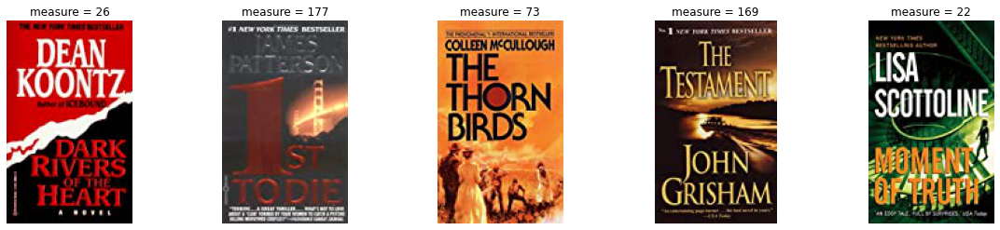

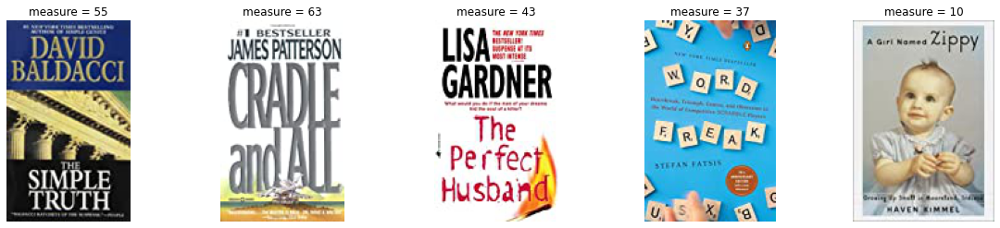

In [ ]:
T.top_books("usa", 45)

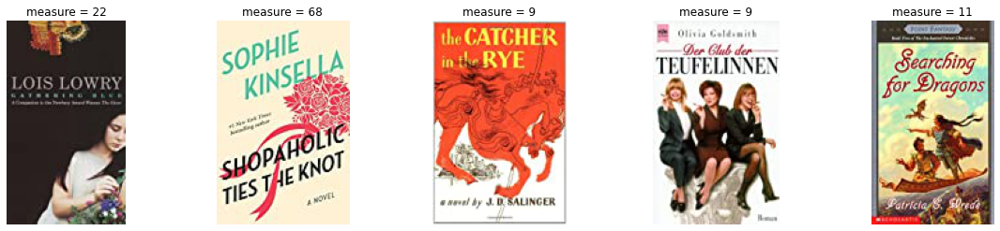

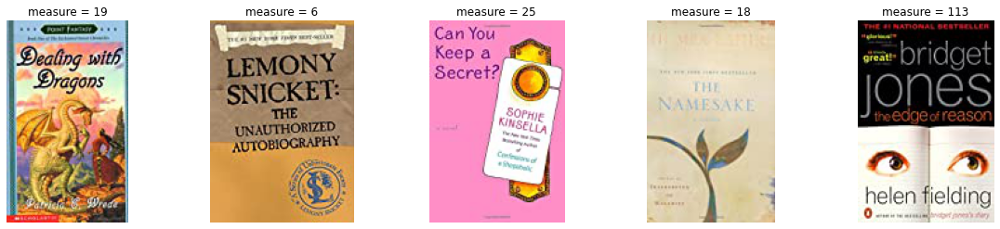

In [ ]:
T.top_books("germany", 25)

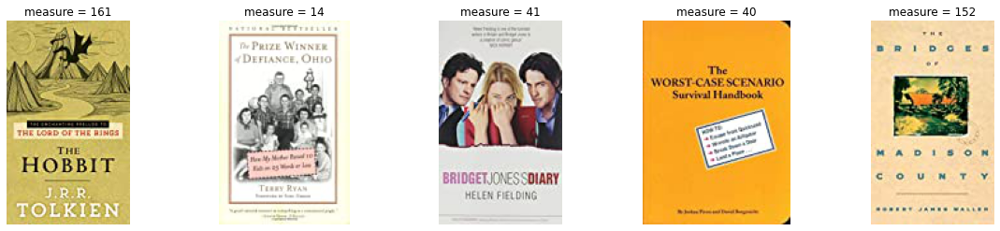

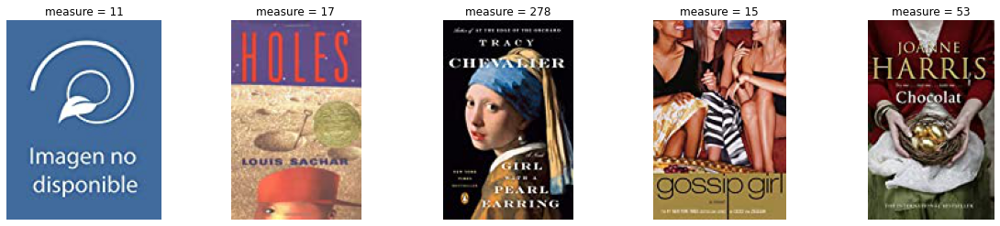

In [ ]:
T.top_books("united kingdom", 17)

### Кластеризация похожих пользователей

In [ ]:
csr_rates

<10902x10552 sparse matrix of type '<class 'numpy.int64'>'
	with 109542 stored elements in COOrdinate format>

In [ ]:
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity 
from sklearn.metrics import pairwise_distances

In [ ]:
cos = cosine_similarity(csr_rates)

In [ ]:
class Clustering():
  def __init__(self, Int, cosine):
        self.product_id_to_url = {}
        for i in Int[["product_id", "picture_url"]].drop_duplicates().values:
            self.product_id_to_url[i[0]] = i[1]
        self.interactions = Int
        self.cos = cosine

  def advice(self, user):
      mask = (self.cos[user] > 0) & (self.cos[user] != 1.0)
      similar = np.where(mask)[0]
      books = []
      for i in similar:
          self.interactions[interactions['vid'] == i]
          try:
              for j in self.interactions[(self.interactions['vid'] == i)]["product_id"]:
                  books.append(j)
          except:
              pass
      rate = []
      for i in np.unique(books):
          dr = []
          for j in similar:
              try:
                  dr.append(self.interactions[(self.interactions['product_id'] == i) 
                            & (self.interactions['vid'] == j)]["Book-Rating"].values[0])
              except:
                  pass
          rate.append(np.mean(dr)) 
      rate = np.array(rate)   
      books = np.unique(books)
      sort = np.unique(np.sort(rate))
      mask = (rate == sort[-1]) | (rate == sort[-2]) | (rate == sort[-3])
      books = np.sort(books[mask])[-10:]
      rec_imaging(books, self.product_id_to_url, interactions["user_num"].values)

In [ ]:
Cl = Clustering(interactions, cos)

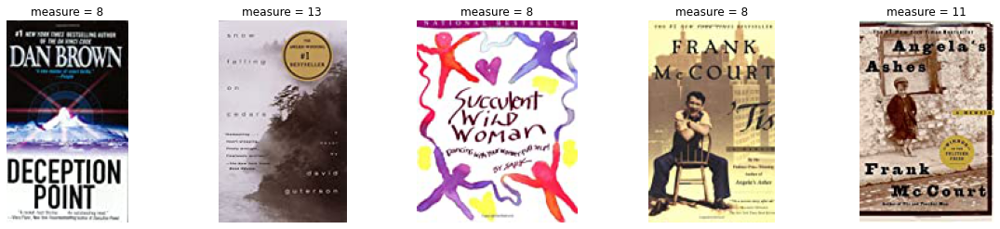

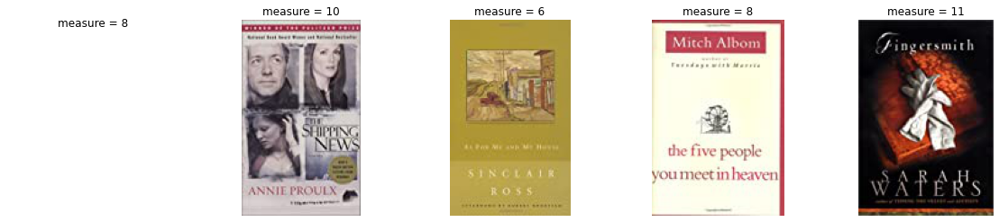

In [ ]:
Cl.advice(0)

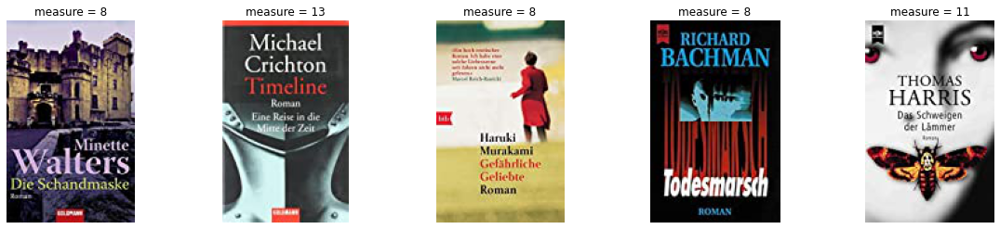

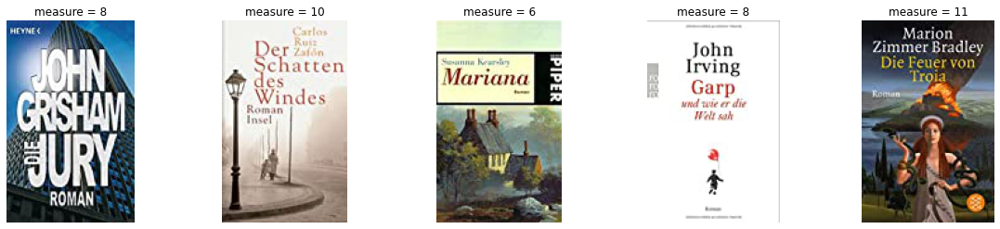

In [ ]:
Cl.advice(3)

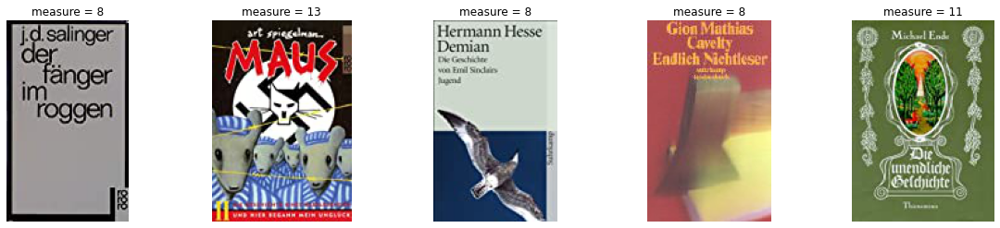

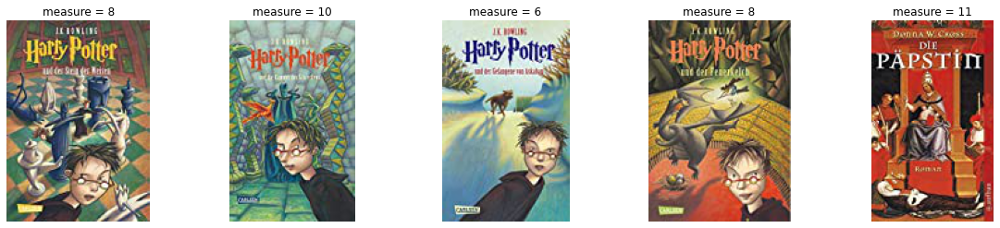

In [ ]:
Cl.advice(4205)

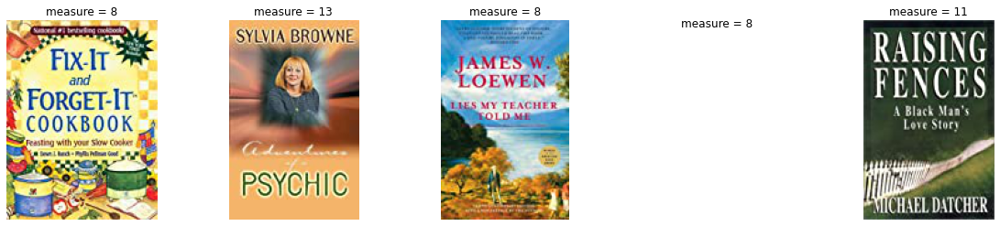

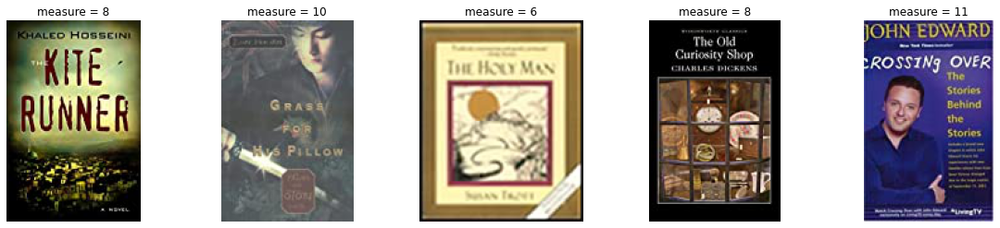

In [ ]:
Cl.advice(4975)

### Совстречаемость

In [ ]:
class Recomendations():
    def __init__(self, Int):
        self.product_id_to_url = {}
        for i in Int[["product_id", "picture_url"]].drop_duplicates().values:
            self.product_id_to_url[i[0]] = i[1]
        self.interactions = Int
   
    def coocurrency_count(self):
        Int = self.interactions[["vid", "product_id"]].drop_duplicates()
        user_products = Int.groupby(["vid"])["product_id"].apply(list).reset_index()
        product_num = [len(i) for i in user_products["product_id"]]
        user_products["prod_num"] = product_num
        user_products = user_products[user_products["prod_num"] > 1]
        
        cooc = {}
        for i in tqdm.tqdm_notebook(user_products.values):
            for j in range(len(i[1])):
                for k in range(len(i[1])):
                    if j != k:
                        try:
                            cooc[str(i[1][j]) + "_" + str(i[1][k])] += 1
                        except:
                            cooc[str(i[1][j]) + "_" + str(i[1][k])] = 1
        cooc_list = []
        for i, j in cooc.items():
            if j != 1:
                cooc_list.append(i.split("_") + [j])
        self.cooc_rec = pd.DataFrame(cooc_list, columns=["item1", "item2", "measure"])


 #Будем выводить книги с самыми высокими средними оценками.
 #Рейтинг '0' - если оценки не найдены

    
    def get_rec(self, j, show=False):
        recs = self.cooc_rec[self.cooc_rec["item1"] == str(j)]
        rating = []
        for i in recs.index:
            a = np.round(self.interactions[interactions['vid'] == int(recs["item1"][i])]["Book-Rating"].mean(), 1)
            b = np.round(self.interactions[interactions['vid'] == int(recs["item2"][i])]["Book-Rating"].mean(), 1)
            if math.isnan(a):
                rating.append(b)
            if math.isnan(b):
                rating.append(a)
            if math.isnan(b) and math.isnan(a):
                rating.append(0)
            else:
                rating.append(np.mean([a, b]))
        rating = [x for x in rating if str(x) != 'nan']
        recs["rating"] = rating
        recs = recs.reset_index()
        recs = recs.drop("index", axis=1)
        recs = recs.sort_values("rating", ascending=False).head(10)
        print(u"Для книги")       
        rec_imaging([j], self.product_id_to_url)
        print(u"Такие рекомендации")
        rec_imaging(recs["item2"].values.astype(int), self.product_id_to_url, 
                         recs["rating"].values.astype(int))

In [ ]:
cooc_rec = Recomendations(interactions)
cooc_rec.coocurrency_count()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  app.launch_new_instance()


Для книги


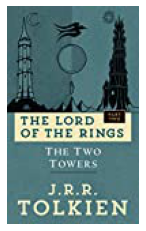

Такие рекомендации


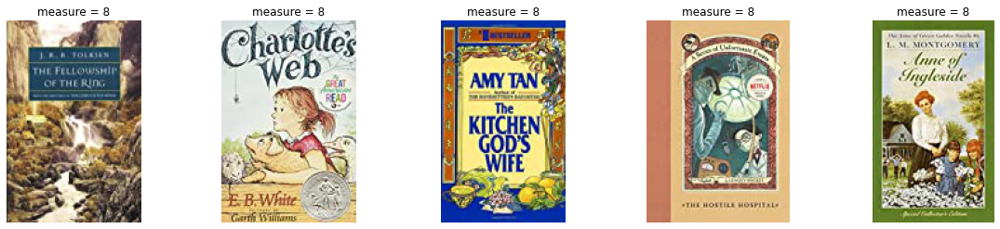

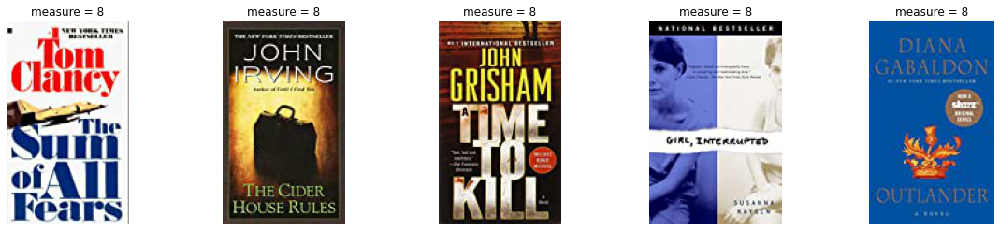

In [ ]:
cooc_rec.get_rec(1867)

Для книги


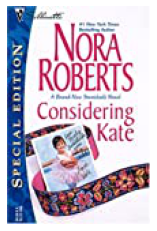

Такие рекомендации


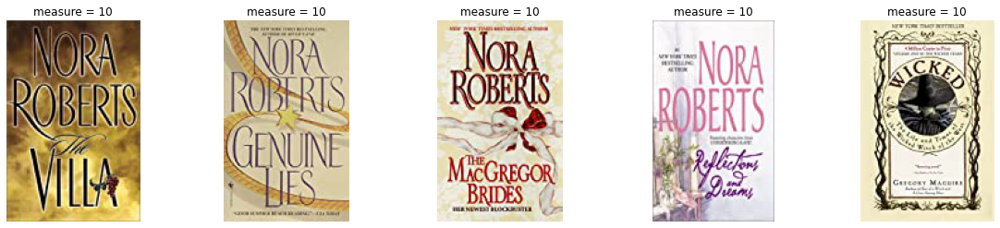

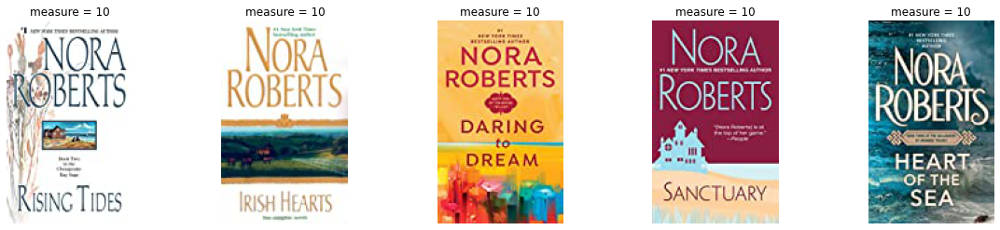

In [ ]:
cooc_rec.get_rec(2345)

Для книги


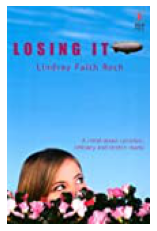

Такие рекомендации


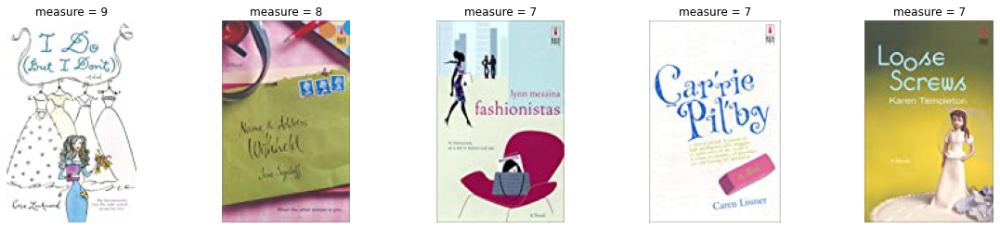

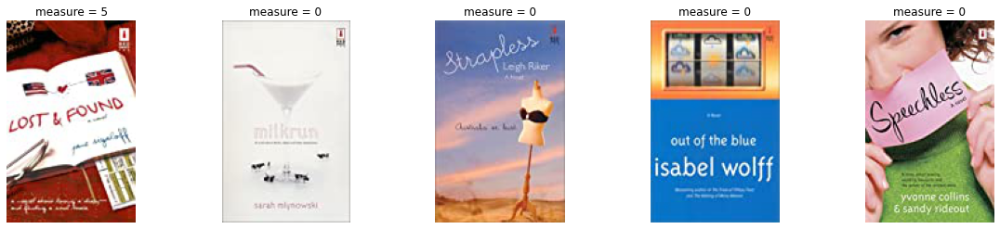

In [ ]:
cooc_rec.get_rec(2370)

Для книги


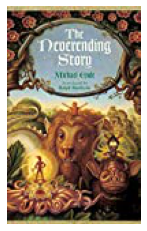

Такие рекомендации


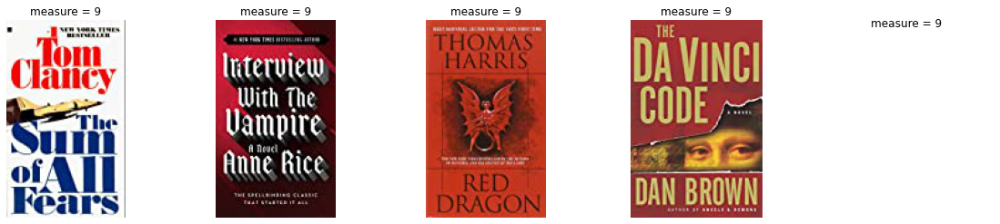

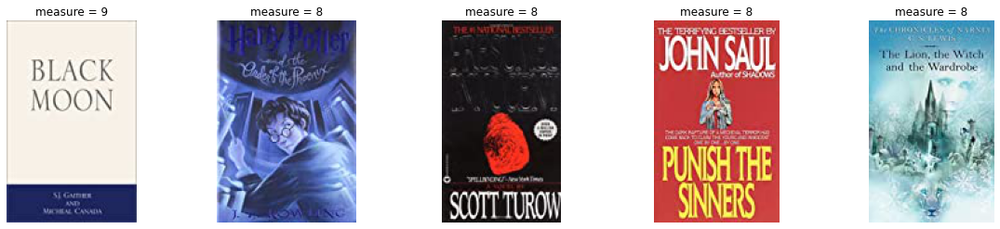

In [ ]:
cooc_rec.get_rec(1000)

### Content-based

In [ ]:
class Content_Based():
    def __init__(self, items, interactions):
        self.items = items
        self.interactions = interactions
        self.content_dict = {}
        for i, j in enumerate(books["Image-URL-M"]):
            self.content_dict[i] = j
        self.inversed_dict = {v: k for k, v in self.content_dict.items()}
        
    def avg_feature_vector(self, words, model, num_features, index2word_set):
        feature_vec = np.zeros((num_features, ), dtype='float32')
        n_words = 0
        for word in words:
            if word in index2word_set:
                n_words += 1
                feature_vec = np.add(feature_vec, model.wv[word])
        if (n_words > 0):
            feature_vec = feature_vec / n_words
        return feature_vec

    def get_books_representation(self):
        
        item_description = [gensim.utils.simple_preprocess(re.sub("[^a-zA-Zа-яА-Я]+", " ", i.lower())) 
                            for i in self.items['Book-Title']]
        #build vocabulary and train model
        self.model = gensim.models.Word2Vec(
                item_description,
                size=200,
                window=10,
                min_count=1,
                workers=10,
                iter=100)
        self.index2word_set = set(self.model.wv.index2word)
        self.items_embs = np.zeros((len(item_description), 200))
        for i in range(self.items_embs.shape[0]):
            self.items_embs[i] = self.avg_feature_vector(item_description[i], self.model, 200, self.index2word_set)
        
        
    def get_rec_I2I(self, id):
        metrics = cosine_similarity([self.items_embs[id]], self.items_embs)
        print(u"Для книги")
        rec_imaging([id], self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(metrics)[0][::-1][1:11], self.content_dict, np.sort(metrics)[0][::-1][1:11])


    def get_rec_U2I(self, i):
        ui = self.interactions[self.interactions["vid"] == i]
        user_vector = " ".join(ui['Book-Title'])
        user_processed = gensim.utils.simple_preprocess(re.sub("[^a-zA-Zа-яА-Я]+", " ", user_vector.lower()))
        user_emb = self.avg_feature_vector(user_processed, self.model, 200, self.index2word_set)
        metrics = cosine_similarity([user_emb], self.items_embs)
        print(u"Для пользователя, который взаимодействовал с товарами")
        rec_imaging(np.unique([self.inversed_dict[i] for i in ui["picture_url"]]), self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(metrics)[0][::-1][1:11], self.content_dict, np.sort(metrics)[0][::-1][1:11])

In [ ]:
CB = Content_Based(books, interactions)
CB.get_books_representation()

Для книги


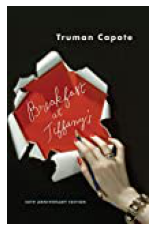

Такие рекомендации


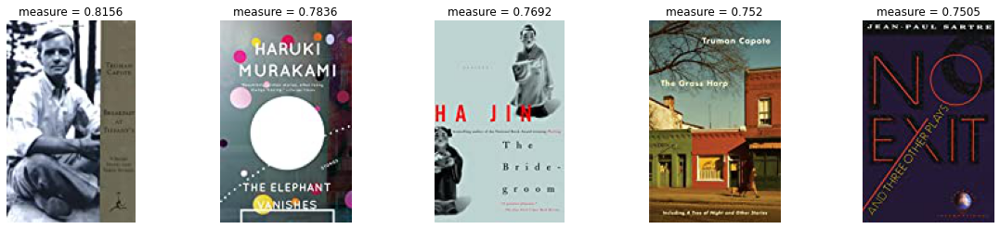

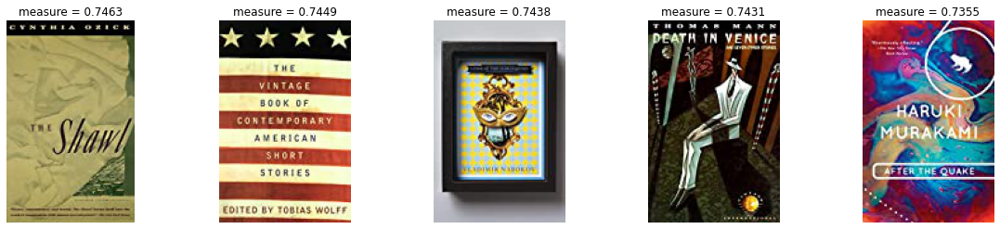

In [ ]:
CB.get_rec_I2I(1234)

Для книги


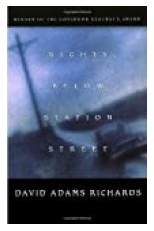

Такие рекомендации


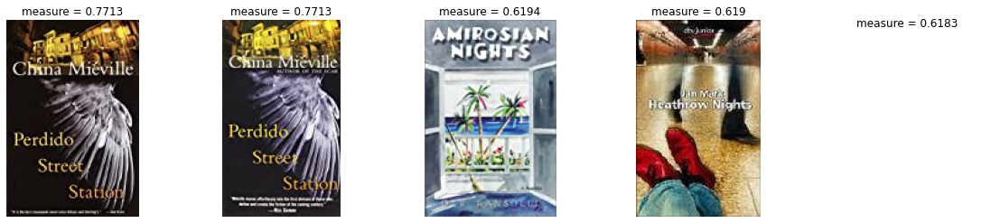

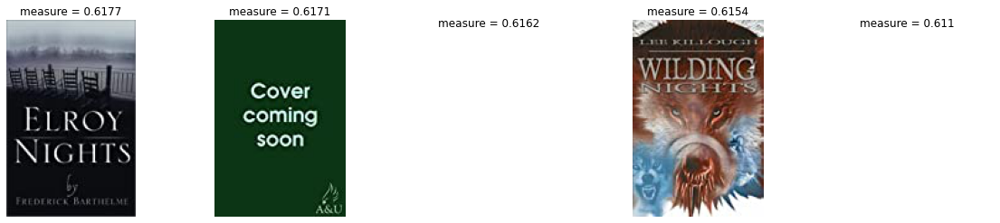

In [ ]:
CB.get_rec_I2I(10)

Для книги


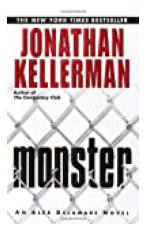

Такие рекомендации


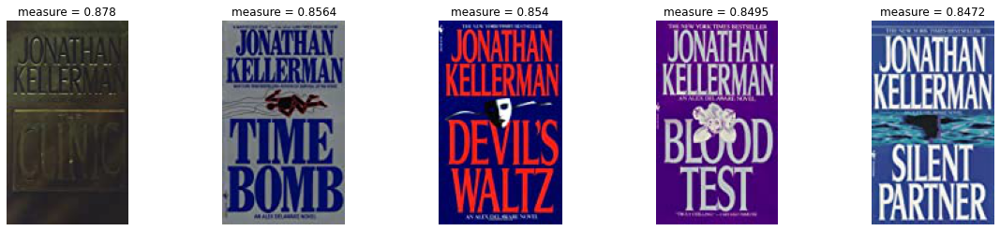

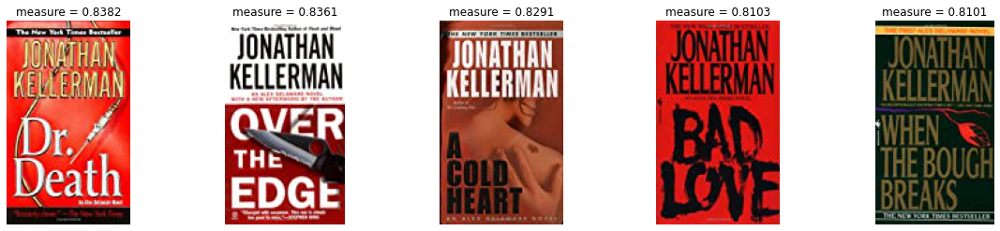

In [ ]:
CB.get_rec_I2I(3000)

Для пользователя, который взаимодействовал с товарами


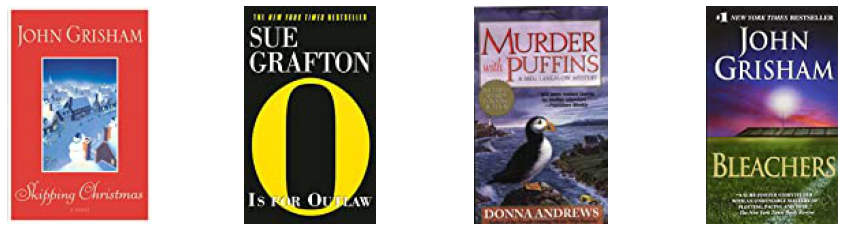

Такие рекомендации


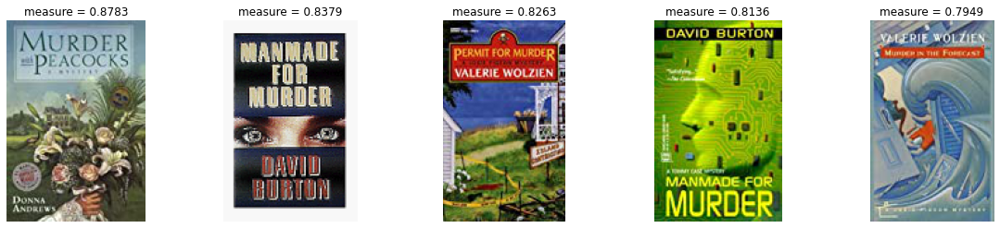

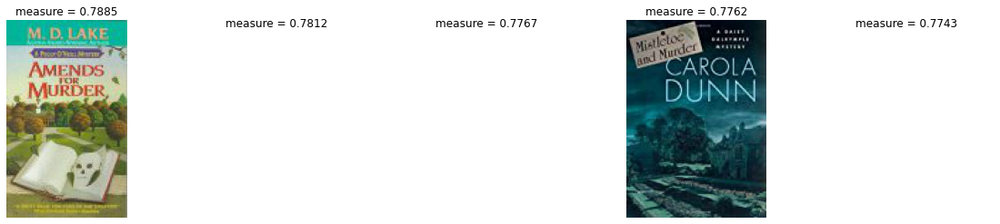

In [ ]:
CB.get_rec_U2I(1234)

Для пользователя, который взаимодействовал с товарами


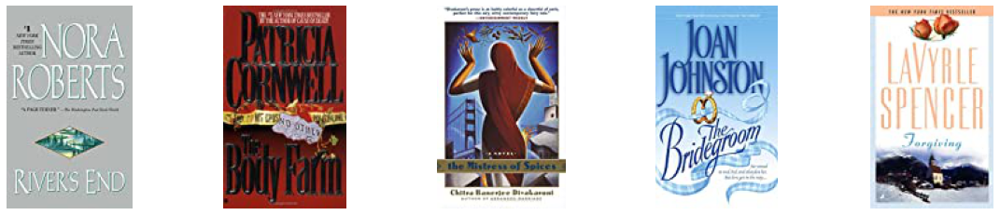

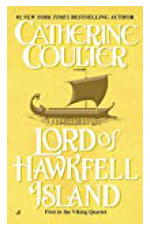

Такие рекомендации


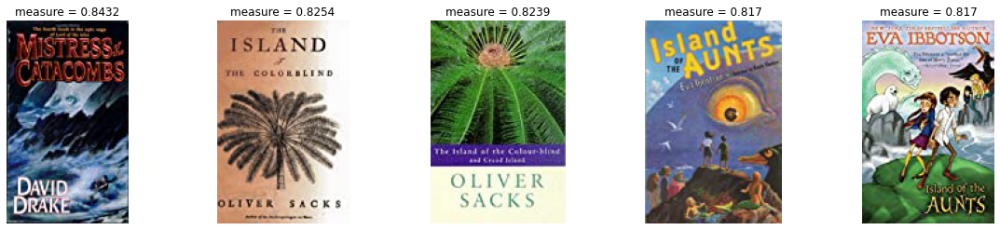

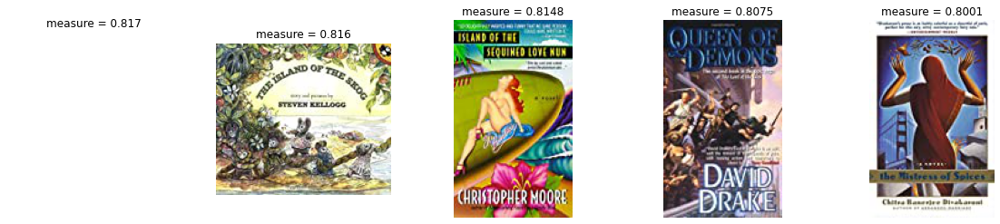

In [ ]:
CB.get_rec_U2I(1111)

### Матричная Факторизация

In [ ]:
csr_rates

<10902x10552 sparse matrix of type '<class 'numpy.int64'>'
	with 109542 stored elements in COOrdinate format>

In [ ]:
 class MatrixFactorization(): 
    def __init__(self, interactions, k, csr_rates):
        self.csr_rates = csr_rates
        self.k = k
        self.interactions = interactions
        self.content_dict = {}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.content_dict[i] = j

    def MF(self):
        U, S, V = svds(self.csr_rates.astype(float), k=self.k)
        self.user_embs = U
        self.items_embs = V.T

    def get_rec(self, i):
        metrics = cosine_similarity([self.items_embs[i]], self.items_embs)
        print(u"Для книги")
        rec_imaging([i], self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(-metrics)[0][1:11], self.content_dict, -np.round(np.sort(-metrics)[0][1:11], 4))

In [ ]:
simple_svd = MatrixFactorization(interactions, 100, csr_rates)
simple_svd.MF()

Для книги


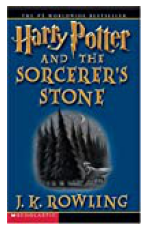

Такие рекомендации


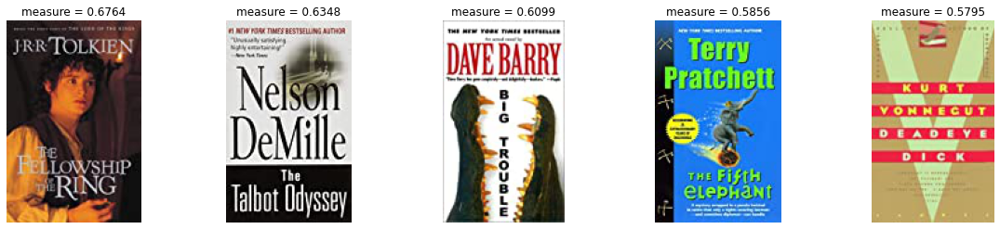

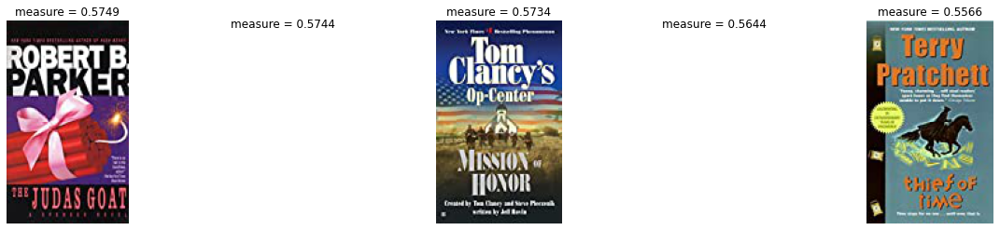

In [ ]:
simple_svd.get_rec(4171)

Для книги


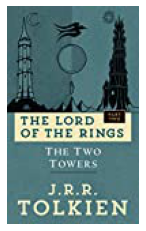

Такие рекомендации


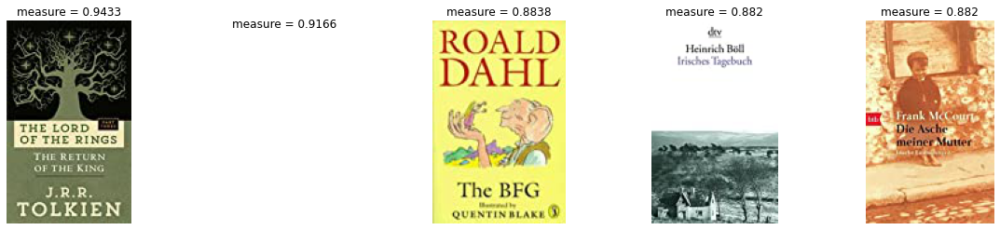

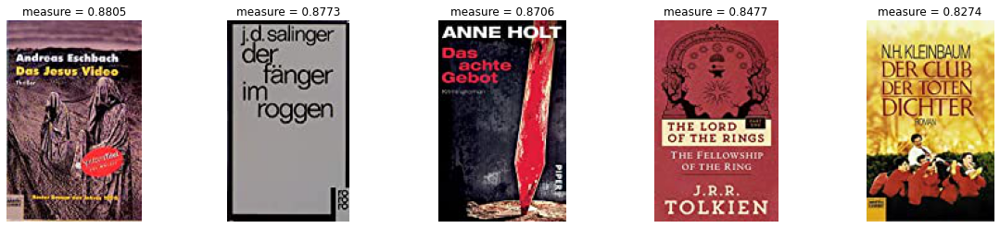

In [ ]:
simple_svd.get_rec(1867)

Для книги


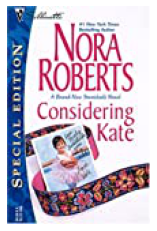

Такие рекомендации


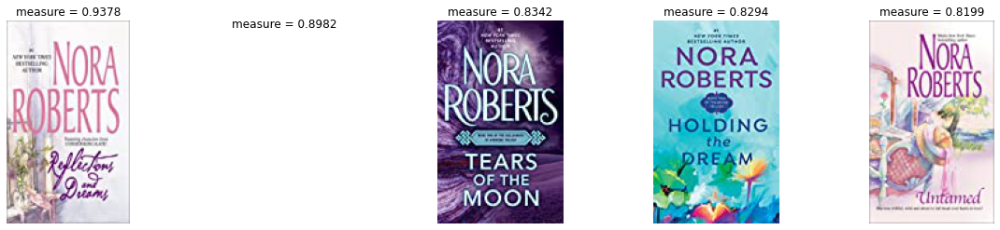

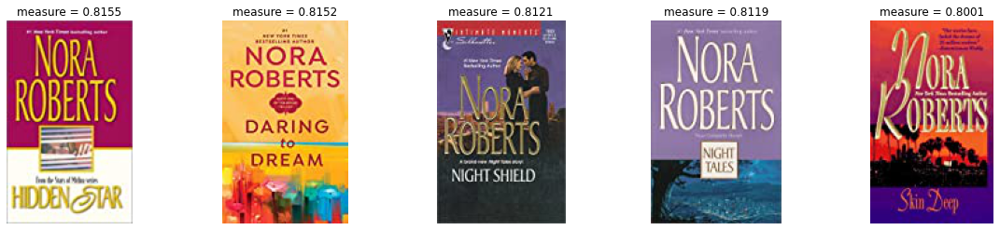

In [ ]:
simple_svd.get_rec(2345)